<a href="https://colab.research.google.com/github/amir-asari/SEBB4083-Assignment2024/blob/main/G1_Mini_Project_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mini Project 2024 (Groceries Detection)
### Total marks: 30

### Group No.: GROUP 1

###Group Members:
1) KHOO SI XIN (A20EB0027)

2) MUHAMMAD FARIS BIN MOHD YAZRI (A20EB0039)

3) NAIF ABDULRAHMAN EISSA AL-JAPAIRAI (A20EB4015)

4) WAN NUR YASMIN DIYANA BINTI WAN SALLEHUDDIN (A20EB0085)


## Chapter 1: Introduction
In an era where technological advancements are revolutionizing every aspect of life, the potential of deep learning to address everyday challenges is immense. Our project, Automated Groceries Detection for the Visually Impaired, is a step towards leveraging deep learning to enhance accessibility. As Group 1, we aim to develop an efficient and reliable algorithm to classify groceries, specifically distinguishing between milk and water, using captured grocery images. This initiative not only showcases the application of Convolutional Neural Networks (CNNs) but also emphasizes the importance of creating inclusive technologies that cater to the needs of the visually impaired.

The visually impaired community faces numerous obstacles in their daily lives, and grocery shopping is no exception. Navigating through crowded aisles, identifying products, and ensuring accurate purchases can be a daunting task. Our project seeks to address these challenges by developing an automated system that can detect and classify groceries in real-time, providing visually impaired individuals with a more seamless and independent shopping experience [3].

By leveraging the power of deep learning, our algorithm will be trained on a comprehensive dataset of grocery images, enabling it to accurately distinguish between milk and water containers. This classification capability is crucial as milk and water are commonly packaged in similar containers, making it difficult for visually impaired individuals to differentiate between them [4].

The system will be designed to work in conjunction with a mobile device or a wearable camera, allowing users to capture images of the desired groceries. The algorithm will then process the images and provide auditory feedback, informing the user whether the detected item is milk or water. This real-time detection and classification will empower visually impaired individuals to make informed decisions during their shopping trips, reducing the risk of purchasing the wrong item [5].

Our project aims to contribute to the ongoing efforts in assistive technology and promote inclusivity. By developing an automated groceries detection system, we hope to enhance the independence and quality of life for visually impaired individuals, enabling them to navigate the grocery shopping experience with confidence and ease.

###1.1 Background of study and related works

Deep learning has significantly enhanced computer vision applications, particularly in object detection and recognition, crucial for aiding visually impaired individuals. Object detection involves identifying and locating objects within an image using advanced algorithms, particularly Convolutional Neural Networks (CNNs). This technology has the potential to revolutionize the way visually impaired people interact with their surroundings, providing them with valuable information about their environment. For instance, object detection can help visually impaired individuals navigate through crowded spaces by identifying obstacles and providing real-time feedback.

Research has explored using deep learning for grocery product recognition to assist visually impaired people. Techniques leveraging CNNs have demonstrated high accuracy despite challenges like varying product appearances, making it possible to develop robust systems that can reliably identify and classify grocery items [6]. These systems can help visually impaired individuals navigate grocery stores more effectively, ensuring they can find the products they need with ease. Moreover, deep learning-based grocery recognition can also assist in inventory management and supply chain optimization, enhancing the overall efficiency of the grocery industry.

Another study implemented the Mask R-CNN algorithm, achieving superior accuracy in identifying and locating objects in images, which is useful for assisting visually impaired individuals in understanding their environment [7]. The study focused on recognizing and classifying three main grocery product categories which are beverages, dairy products, and cereals. By combining Scale-Invarient Feature Transform (SIFT) for feature extraction, Principle Component Analysis (PCA) for dimensionality reduction, and various classifiers such as Support Vector Machine (SVM), K-Nearest Neighbours (KNN), Decision Tree, and Random Forest, the researchers were able to achieve an accuracy of about 87% using the Random Forest classifier. This level of accuracy is crucial for visually impaired individuals who rely on accurate information to navigate their environment.

Further research integrated CNN models into mobile robotic assistants, providing real-time feedback to help visually impaired users navigate their surroundings safely [8]. The system used a computer vision-based approach with a Convolutional Neural Network at its core, scanning objects placed beneath a webcam for identification and achieving reasonable test-time accuracy. This integration of deep learning and robotics has the potential to greatly enhance the mobility and independence of visually impaired individuals, enabling them to perform daily tasks with greater ease and confidence.

###1.2 Objectives

a. Dataset Development:

- Collect images of milk and water from local supermarkets.
- Capture 400 images for each class (200 near mode and 200 far mode) to create a comprehensive dataset.

b. Algorithm Development:

- Utilize the VGG16 model for transfer learning.
Implement an automated algorithm to classify between the milk and water.

## Chapter 2: Methodology and Results

Step 1: Setup

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil

import tensorflow as tf
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

!pip install zipfile36
from zipfile36 import ZipFile

Step 2: Data Preprocessing

The dataset was downloaded from Google Drive.

In [ ]:
! gdown https://drive.google.com/drive/u/0/folders/14uFIVTSAHpYglBECuF4RMeUyEfxgBlaD

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=None
  warnings.warn(
Downloading...
From: https://drive.google.com/drive/u/0/folders/14uFIVTSAHpYglBECuF4RMeUyEfxgBlaD
To: /content/14uFIVTSAHpYglBECuF4RMeUyEfxgBlaD
1.21MB [00:00, 19.3MB/s]


The downloaded dataset file was unzipped.

In [ ]:
with ZipFile('/content/G1dataset_resize.zip','r') as zipObj:
  zipObj.extractall()

####Load data using Keras utility

Next, these images off disk were loaded using the helpful tf.keras.utils.image_dataset_from_directory utility. This would take from a directory of images on disk to a tf.data.Dataset in just a couple lines of code.

Step 3: Create a dataset

Some parameters were defined for the ImageDataGenerator.

In [ ]:
batch_size = 50 # using mini-batch gradient descent
img_height = 224
img_width = 224

Step 4: Data Splitting

Data was splitted into 70% training data and 30% testing data. Once splitted, all data will saved in folder called training_data and testing_data.

In [ ]:
# Define the path to your dataset directory
dataset_dir = '/content/G1dataset_resize'

# Define the path to the directory where you want to create the train and test folders
output_dir = '/content/G1dataset_output'

# Define the percentage of data to be used for testing
test_split = 0.3

# Get the list of subfolders in the dataset directory
subfolders = [subfolder for subfolder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, subfolder))]

print(subfolders)

# Define the train and test folder paths
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')

# Delete train and test folders if they already exist
if os.path.exists(train_dir):
    shutil.rmtree(train_dir)
if os.path.exists(test_dir):
    shutil.rmtree(test_dir)

# Create the train and test folders in the output directory
os.makedirs(train_dir)
os.makedirs(test_dir)

# Iterate over each subfolder and split the images into train and test sets
for subfolder in subfolders:
    subfolder_path = os.path.join(dataset_dir, subfolder)
    images = os.listdir(subfolder_path)
    train_images, test_images = train_test_split(images, test_size=test_split, random_state=42)

    # Create the subfolders inside train and test directories
    train_subfolder_dir = os.path.join(train_dir, subfolder)
    test_subfolder_dir = os.path.join(test_dir, subfolder)
    os.makedirs(train_subfolder_dir)
    os.makedirs(test_subfolder_dir)

    # Move the train images to the train folder
    for image in train_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(train_dir, subfolder, image)
        print(src)
        print(dst)
        shutil.copyfile(src, dst)

    # Move the test images to the test folder
    for image in test_images:
        src = os.path.join(subfolder_path, image)
        dst = os.path.join(test_dir, subfolder, image)
        shutil.copyfile(src, dst)

['G1datasetmilk_resize', 'G1datasetwater_resize']
/content/G1dataset_resize/G1datasetmilk_resize/20240703_002523.jpg
/content/G1dataset_output/train/G1datasetmilk_resize/20240703_002523.jpg
/content/G1dataset_resize/G1datasetmilk_resize/20240703_002433.jpg
/content/G1dataset_output/train/G1datasetmilk_resize/20240703_002433.jpg
/content/G1dataset_resize/G1datasetmilk_resize/20240703_002722.jpg
/content/G1dataset_output/train/G1datasetmilk_resize/20240703_002722.jpg
/content/G1dataset_resize/G1datasetmilk_resize/11adc092-a6f7-4ab2-bca1-71176668478a.jpg
/content/G1dataset_output/train/G1datasetmilk_resize/11adc092-a6f7-4ab2-bca1-71176668478a.jpg
/content/G1dataset_resize/G1datasetmilk_resize/IMG_7826.jpg
/content/G1dataset_output/train/G1datasetmilk_resize/IMG_7826.jpg
/content/G1dataset_resize/G1datasetmilk_resize/IMG_7866.jpg
/content/G1dataset_output/train/G1datasetmilk_resize/IMG_7866.jpg
/content/G1dataset_resize/G1datasetmilk_resize/IMG_7857.jpg
/content/G1dataset_output/train/G1da

The path was defined to the subfolder containing the images.

In [ ]:
# Define the path to the subfolder containing the images
test_milk_path = '/content/G1dataset_output/test/G1datasetmilk_resize'
test_water_path = '/content/G1dataset_output/test/G1datasetwater_resize'
train_milk_path = '/content/G1dataset_output/train/G1datasetmilk_resize'
train_water_path = '/content/G1dataset_output/train/G1datasetwater_resize'

# Count the number of images in the subfolder
num_images1 = len([name for name in os.listdir(test_milk_path) if os.path.isfile(os.path.join(test_milk_path, name))])
num_images2 = len([name for name in os.listdir(test_water_path) if os.path.isfile(os.path.join(test_water_path, name))])
num_images3 = len([name for name in os.listdir(train_milk_path) if os.path.isfile(os.path.join(train_milk_path, name))])
num_images4 = len([name for name in os.listdir(train_water_path) if os.path.isfile(os.path.join(train_water_path, name))])

# Print the number of images in the subfolder
print(f"Number of images in the test/milk: {num_images1}")
print(f"Number of images in the test/water: {num_images2}")
print(f"Number of images in the train/milk: {num_images3}")
print(f"Number of images in the train/water: {num_images4}")

Number of images in the test/milk: 120
Number of images in the test/water: 120
Number of images in the train/milk: 280
Number of images in the train/water: 280


Step 5: Take the 20% of training data and used it as the validation data

After that, a `tf.keras.preprocessing.image.ImageDataGenerator` object was created which handled the image dataset for training and testing.

Then the object function called `flow_from_directory` was used provide batch of image dataset according to specification based on function input argument.

20% from the training data was taken out and used as validation data

In [ ]:
# Create an instance of the ImageDataGenerator with for training and testing
train_data_generator = ImageDataGenerator( validation_split=0.2) # 20% from training will be leaved out for validation
test_data_generator = ImageDataGenerator()

names = ["G1datasetmilk_resize" , "G1datasetwater_resize"] #make sure the spelling is similar to the folder name

# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/G1dataset_output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

# Create the validation batch generator
validation_batches = train_data_generator.flow_from_directory(
    '/content/G1dataset_output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='validation',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)


# Create the test generator
test_batches = test_data_generator.flow_from_directory(
    '/content/G1dataset_output/test',
    target_size = (224,224),
    class_mode = 'sparse', #make label as integer value
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 448 images belonging to 2 classes.
Found 112 images belonging to 2 classes.
Found 240 images belonging to 2 classes.


Step 6: Visualize the data

(50, 224, 224, 3)
(50,)


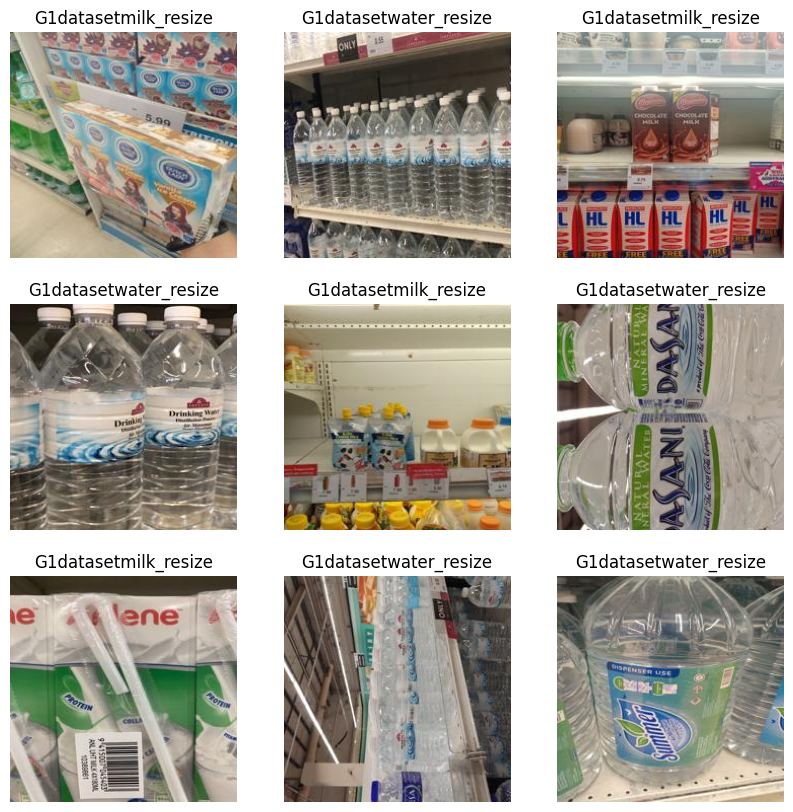

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

Step 7: Create the base model from the pre-trained VGG16

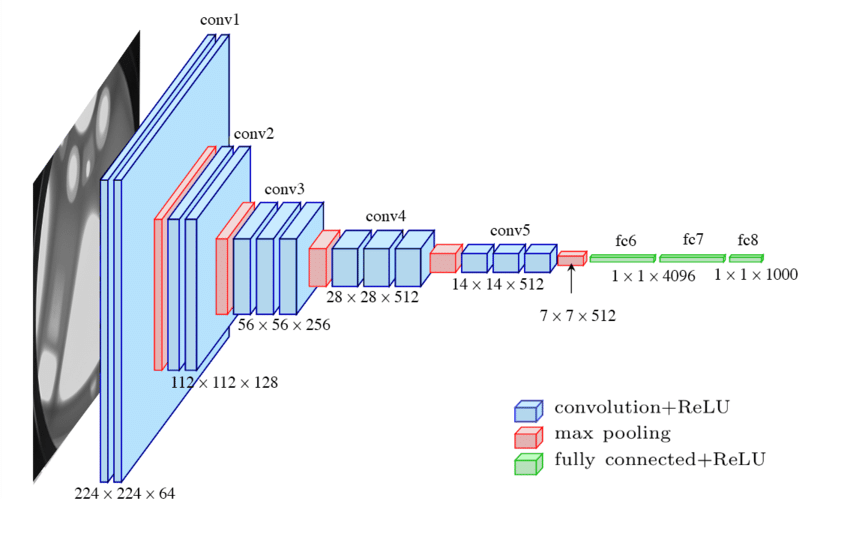

First, instantiate a VGG16 model pre-loaded with weights trained on ImageNet.

In [ ]:
# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16()

# print(type(base_model))
print("****VGG16 original network arhitecture****")
base_model.summary()

553467096/553467096 [==============================] - 6s 0us/step
****VGG16 original network arhitecture****
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                 

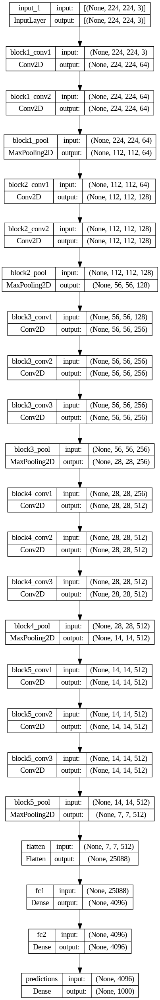

In [ ]:
tf.keras.utils.plot_model(base_model, to_file = 'VGG16_basemodel.png', show_shapes = True)

**Result of questions**

a) No image augmentation, Only unfreeze the last layer

Step 1: Recreating the model from VGG16

The model was created by copying from the 1st layer to the 2nd last layer.

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                             

Step 2: Freeze the existing weights and add the last layer with new dense layer

The last layer with new dense layer with 2 outputs was added, replacing the dense layer with 1000 outputs

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

# #example if your want to unfreeze 2 last layers
# for layer in model.layers[-2:]:
#     layer.trainable = True

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

Step 3: Model Compiling

The model was compiled before training it. Since there were two classes, the tf.keras.losses.BinaryCrossentropy loss with from_logits=True since the model was used provides a linear output.

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Step 4: Model Training

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
9/9 [==============================] - 312s 34s/step - loss: 0.4668 - accuracy: 0.8304 - val_loss: 0.1719 - val_accuracy: 0.9554
Epoch 2/3
9/9 [==============================] - 310s 35s/step - loss: 0.0727 - accuracy: 0.9754 - val_loss: 0.3749 - val_accuracy: 0.8661
Epoch 3/3
9/9 [==============================] - 307s 35s/step - loss: 0.0260 - accuracy: 0.9888 - val_loss: 0.2152 - val_accuracy: 0.9196


Step 5: Learning Curves Plotting

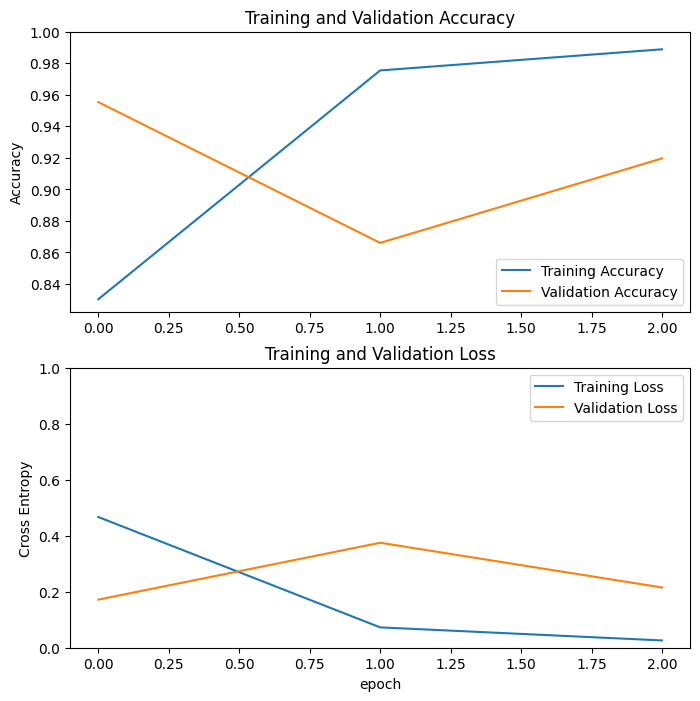

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Step 6: Model Testing

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

5/5 [==============================] - 132s 26s/step - loss: 0.0545 - accuracy: 0.9792
Test accuracy: 0.9791666865348816


The developed model was tested in several test images and visual the image, the predicted label, actual label and the probability (in %).

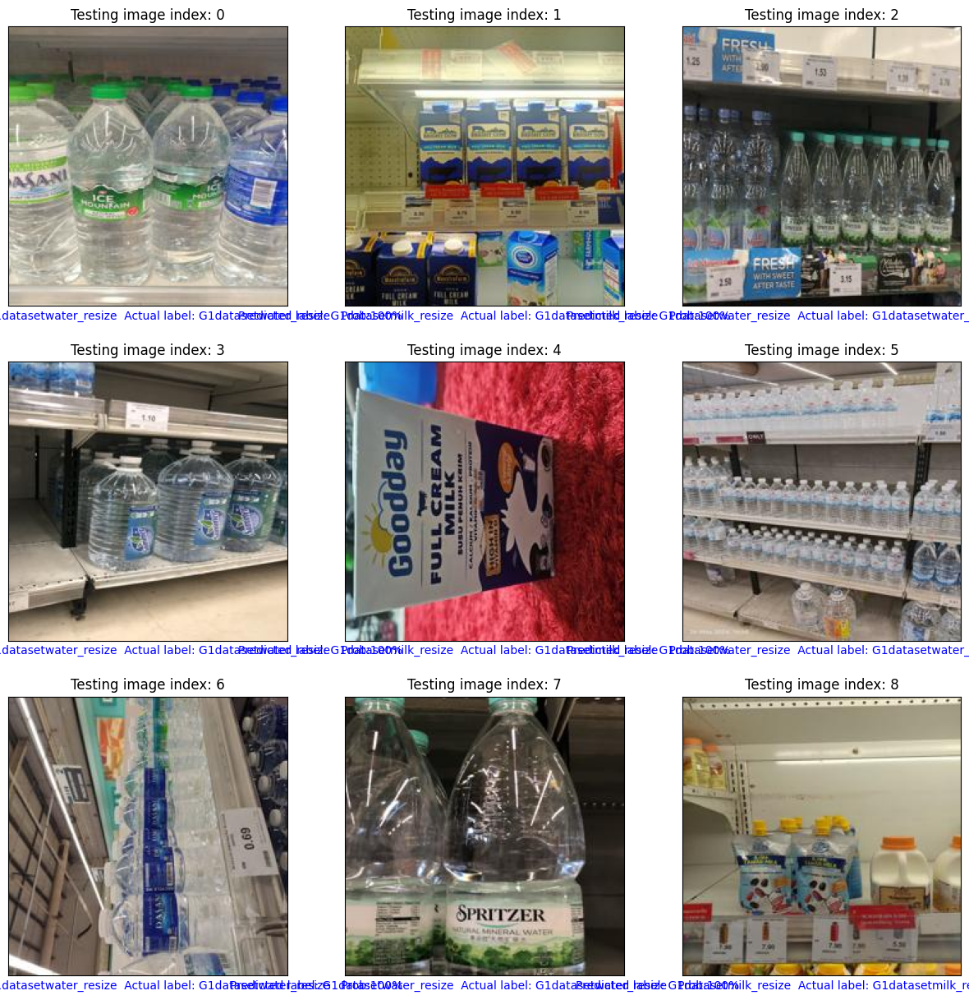

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  predicted_label = np.argmax(predictions_array[i])

  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("Predicted label: {}  Actual label: {}   Prob:{:2.0f}%".format(names[predicted_label],
                                names[true_label],
                                100*np.max(predictions_array)),
                                color=color)


single_test_image_batch = test_batches.next()
predicted_label_prob = model(single_test_image_batch[0]) # single_test_image_batch[0] -> batches of images; single_test_image_batch[1] -> batches of label
predicted_label_prob = tf.nn.softmax(predicted_label_prob)


plt.figure(figsize=(15, 15))
for index in range(9):
  ax = plt.subplot(3, 3, index + 1)
  plot_image(index,predicted_label_prob,single_test_image_batch[1],single_test_image_batch[0])
  plt.title("Testing image index: {}".format(index))

**b) With image augmentation, Only unfreeze the last layer**

Step 1: Create an instance ImageDataGenerator with augmentation mechanism

An instance of `ImageDataGenerator` was created to include with augmentation mechanism.

In [ ]:
# Create an instance of the ImageDataGenerator with desired augmentation options for training and validation
train_data_generator = ImageDataGenerator( validation_split=0.2,
                                          rotation_range = 20,
                                          width_shift_range=0.2,
                                          height_shift_range=0.2,
                                          )

Step 2: Create the train batch generator

In [ ]:
# Create the train batch generator
train_batches = train_data_generator.flow_from_directory(
    '/content/G1dataset_output/train',
    target_size = (img_width,img_height),
    class_mode = 'sparse', #make label as integer value
    subset='training',
    batch_size = batch_size,
    shuffle = True,
    color_mode = "rgb",
    classes = names
)

Found 448 images belonging to 2 classes.


Step 3: Visualize the augmented images

(50, 224, 224, 3)
(50,)


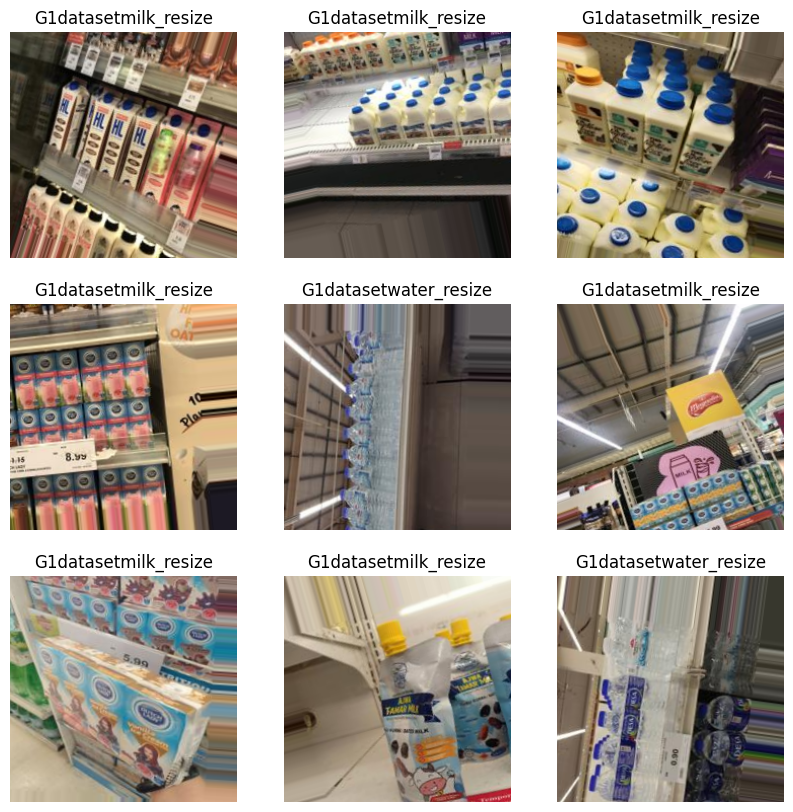

In [ ]:
import matplotlib.pyplot as plt

single_train_image_batch = train_batches.next()  #single_train_batch[0] -> image  single_train_batch [1] -> label
batch_images = single_train_image_batch[0]
batch_labels = single_train_image_batch[1]
print(batch_images.shape)
print(batch_labels.shape)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(batch_images[i].astype("uint8"))
  plt.title(names[batch_labels[i].astype("int")])
  plt.axis("off")

Step 4: Recreate the model from VGG16

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

Step 5: Only unfreeze the last layer

In [ ]:
#Freezing the existing weights
for layer in model.layers[:-1]:
    layer.trainable = False
    print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))

for layer in model.layers[-1:]:
    layer.trainable = True

print("model after add new dense layer replacing the previous VGG16 last layer")
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

Step 6: Model Compiling

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Step 7: Model Training

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
9/9 [==============================] - 318s 36s/step - loss: 0.8414 - accuracy: 0.7054 - val_loss: 0.2374 - val_accuracy: 0.9286
Epoch 2/3
9/9 [==============================] - 330s 38s/step - loss: 0.1882 - accuracy: 0.9263 - val_loss: 0.9490 - val_accuracy: 0.7411
Epoch 3/3
9/9 [==============================] - 313s 35s/step - loss: 0.1374 - accuracy: 0.9509 - val_loss: 0.4495 - val_accuracy: 0.8393


Step 8: Learning Curves Plotting

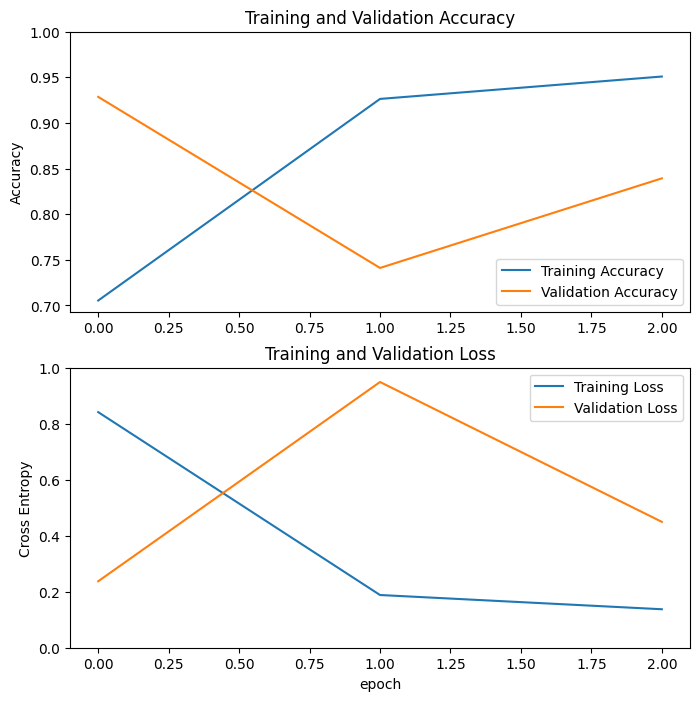

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Step 9: Model Evaluating

In [ ]:
#print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

5/5 [==============================] - 133s 26s/step - loss: 0.1982 - accuracy: 0.9417
Test accuracy: 0.9416666626930237


2/2 [==============================] - 28s 10s/step


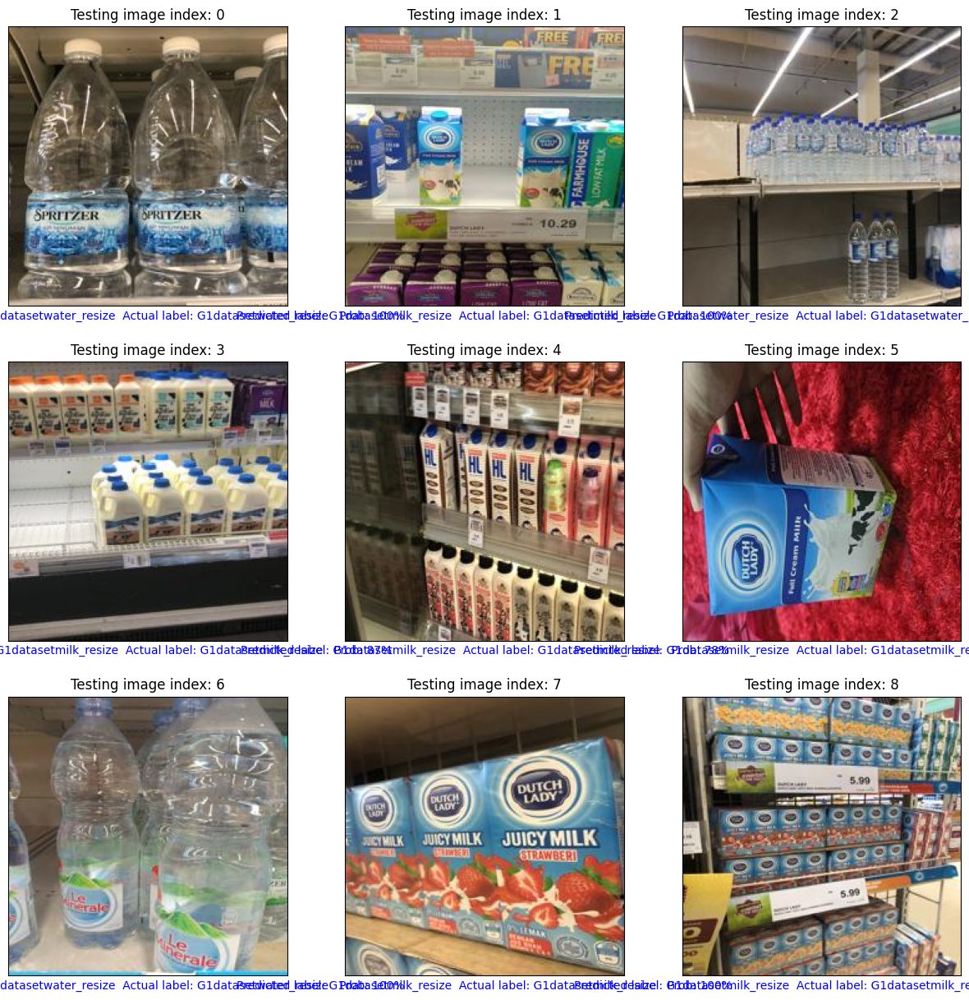

In [ ]:
# Function to plot image with predictions and actual labels
def plot_image(i, predictions_array, true_label, img):
    true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)
    predicted_label = np.argmax(predictions_array[i])

    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("Predicted label: {}  Actual label: {}   Prob: {:2.0f}%".format(names[predicted_label],
                                                                            names[true_label],
                                                                            100 * np.max(predictions_array[i])),
                                                                            color=color)

# Get a batch of test images
single_test_image_batch = test_batches.next()
predicted_label_prob = model.predict(single_test_image_batch[0])
predicted_label_prob = tf.nn.softmax(predicted_label_prob).numpy()

# Plot the test images with predictions and actual labels
plt.figure(figsize=(15, 15))
for index in range(9):
    ax = plt.subplot(3, 3, index + 1)
    plot_image(index, predicted_label_prob, single_test_image_batch[1], single_test_image_batch[0])
    plt.title("Testing image index: {}".format(index))

**c) No image augmentation, Only unfreeze the last and 2nd last layer**

Step 1: Recreate the model from VGG16

In [ ]:
#Create our model by copying from the 1st layer to the 2nd last layer

model = tf.keras.models.Sequential()
for layer in base_model.layers[0:-1]:
  model.add(layer)

print("****model after removing copy all VGG16 layers and remove the last layer****")
model.summary()

****model after removing copy all VGG16 layers and remove the last layer****
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                           

Step 2: Freeze 2nd last and last layer

In [ ]:
#Freezing the existing weights
for layer in model.layers:
    layer.trainable = False
print(model.summary())

#add new layer which will replace the previous VGG16 last layer
model.add(tf.keras.layers.Dense(2))


for layer in model.layers[-2:]:
    layer.trainable = True

print("****model after add new dense layer replacing the previous VGG16 last layer****")
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)      

Step 3: Model Compiling

In [ ]:
learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

Step 4: Model Training

In [ ]:
history = model.fit(train_batches,
                    epochs=3,
                    validation_data=validation_batches)

Epoch 1/3
9/9 [==============================] - 317s 36s/step - loss: 8.0717 - accuracy: 0.8170 - val_loss: 0.1041 - val_accuracy: 0.9643
Epoch 2/3
9/9 [==============================] - 310s 35s/step - loss: 0.9057 - accuracy: 0.9643 - val_loss: 2.1363 - val_accuracy: 0.9375
Epoch 3/3
9/9 [==============================] - 312s 35s/step - loss: 0.2966 - accuracy: 0.9821 - val_loss: 1.5091 - val_accuracy: 0.9375


Step 5: Learning Curves Plotting

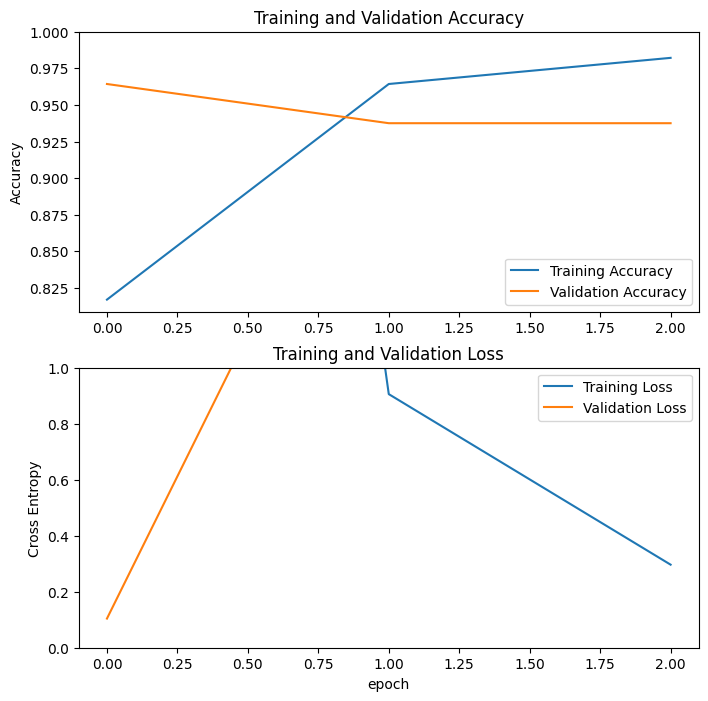

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Step 6: Model Testing

In [ ]:
# print(test_batches.shape)
test_loss, test_acc = model.evaluate(test_batches)

print('Test accuracy:', test_acc)

5/5 [==============================] - 128s 25s/step - loss: 0.4777 - accuracy: 0.9750
Test accuracy: 0.9750000238418579


2/2 [==============================] - 28s 10s/step


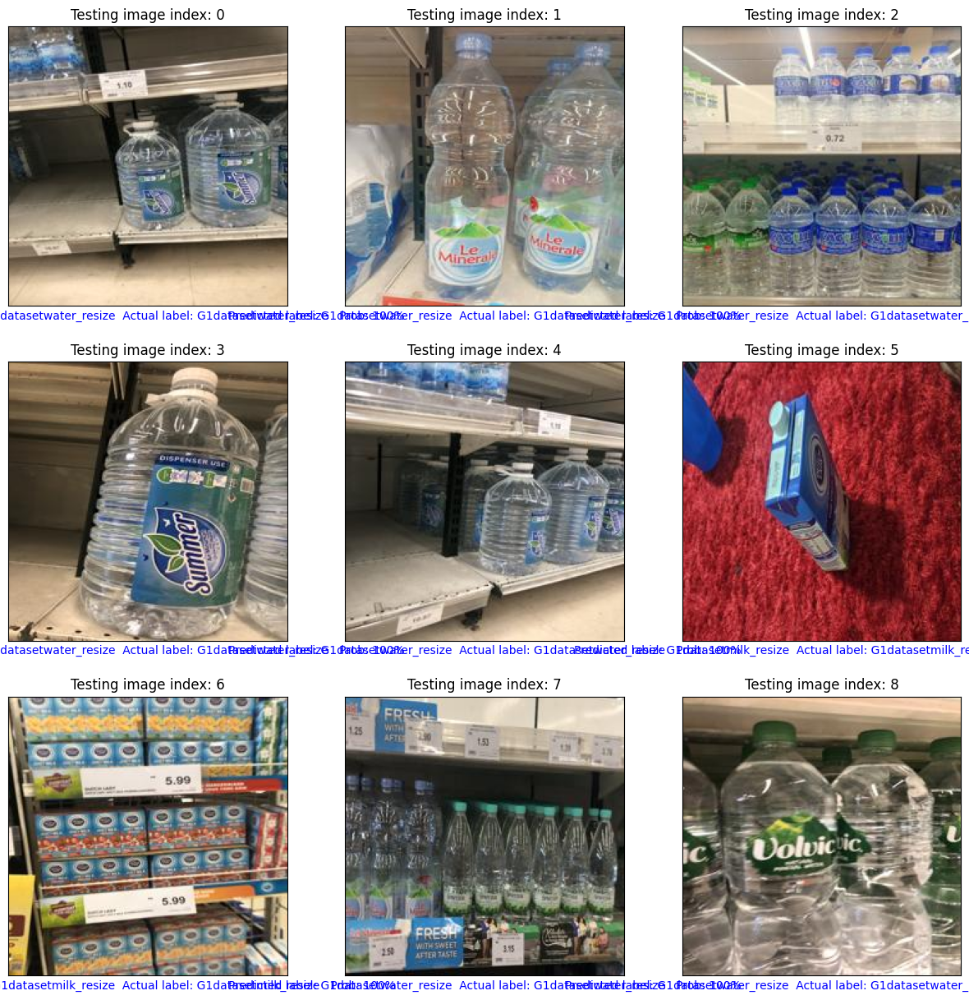

In [ ]:
# Function to plot image with predictions and actual labels
def plot_image(i, predictions_array, true_label, img):
    true_label, img = true_label[i].astype("uint8"), img[i].astype("uint8")
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)
    predicted_label = np.argmax(predictions_array[i])

    if predicted_label == true_label:
        color = 'blue'
    else:
        color = 'red'

    plt.xlabel("Predicted label: {}  Actual label: {}   Prob: {:2.0f}%".format(names[predicted_label],
                                                                            names[true_label],
                                                                            100 * np.max(predictions_array[i])),
                                                                            color=color)

# Get a batch of test images
single_test_image_batch = test_batches.next()
predicted_label_prob = model.predict(single_test_image_batch[0])
predicted_label_prob = tf.nn.softmax(predicted_label_prob).numpy()

# Plot the test images with predictions and actual labels
plt.figure(figsize=(15, 15))
for index in range(9):
    ax = plt.subplot(3, 3, index + 1)
    plot_image(index, predicted_label_prob, single_test_image_batch[1], single_test_image_batch[0])
    plt.title("Testing image index: {}".format(index))

## Chapter 3: Discussion

The VGG16 model architecture comprises multiple Conv2D and MaxPooling2D layers organized into blocks (block1 through block5), each containing several convolutional layers. The model concludes with a Flatten layer that converts 3D feature maps into a 1D vector, followed by two fully connected Dense layers (fc1 and fc2). The final predictions layer has 1000 units, corresponding to the classes in the original ImageNet dataset on which VGG16 was trained.
The dataset consists of a total of 400 samples, divided into a 3:7 ratio for the test and training datasets. Specifically, the test dataset comprises 120 samples each for classes representing milk and water, while the training dataset includes 280 samples. Using TensorFlow's ImageDataGenerator class for data generation across training, validation, and testing datasets, the results are as follows: the training batch generator processes 448 images belonging to 2 classes, the validation batch generator handles 112 images across 2 classes, and the testing batch generator manages 240 images spanning 2 classes.

**a) No image augmentation, Only unfreeze the last layer**

The VGG16 model was modified by removing its final layer, retaining the original convolutional and pooling layers up to the penultimate dense layer. This modified architecture keeps all 134,260,544 parameters intact. By unfreezing the last layer, the final dense layer remains trainable, allowing for fine-tuning while leveraging the pre-trained features of VGG16. During the modification process, the existing weights were frozen, and a new dense layer was added to replace the original final layer.
Testing on multiple images provided visual feedback on predicted labels, actual labels, and probabilities. During the first epoch, the model achieved 83.04% accuracy on training data and 95.54% on validation data, indicating effective learning with minimal validation loss. However, in the second epoch, while training accuracy improved to 97.54%, validation accuracy dropped to 86.61% with increased validation loss, suggesting overfitting. This indicates that the model might have memorized training data details, limiting its generalization to new data. By the third epoch, training accuracy continued to rise, showing ongoing learning.
The accuracy plot shows a steady improvement in training accuracy, reaching nearly 99%, while validation accuracy starts high at about 96%, drops in the second epoch to around 87%, and then slightly improves. This pattern suggests initial overfitting, where the model performs well on training data but struggles with unseen validation data. The loss plot reveals consistent decreases in training loss, indicating learning. However, validation loss initially increases, suggesting overfitting, as the model learns specific details not applicable to new data. Despite this, a decrease in the third epoch shows some recovery in generalization.
The model achieved a test accuracy of 97.92% with a test loss of 0.0545, indicating effective generalization to new data. Despite some overfitting during training, the model accurately classified images into the two categories. The model also generated labels for a batch of test images, plotting the first nine images with their predicted and actual labels, along with prediction probabilities. Correct predictions are shown in blue, and incorrect ones in red, facilitating easy visual comparison.


**b) With image augmentation, Only unfreeze the last layer**

Image augmentation was applied to the training data, with options like rotation, width, and height shifts. The train_batches generator found 448 images in 2 classes.Across the 3 training epochs, the neural network model exhibited an upward trajectory in both training and validation accuracies. Initially, it achieved a solid 70.54% accuracy on the training data and an impressive 92.86% on the validation set, indicating effective learning and generalization early on. However, as training progressed, although the training accuracy continued to climb, peaking at 95.09% by the third epoch, the validation accuracy showed more variability. It dropped to 74.11% in the second epoch before recovering to 83.93% in the third. These fluctuations suggest potential overfitting or a need for regularization techniques to stabilize performance across different datasets. Nonetheless, the model's capacity to generalize from training to validation data underscores its initial robustness and learning capability, albeit with room for further optimization to enhance overall consistency and reliability.
The evaluation shows the model did well on the test data. It had an average loss of 0.1982, meaning it was quite accurate in predicting the right outcomes. The model's accuracy on the test set was 94.17%, which means it got the answers right for almost 94 out of every 100 predictions it made. This performance suggests the model can reliably make correct predictions, which is important for practical use in different types of machine learning tasks.


**c) No image augmentation, Only unfreeze the last and 2nd last layer**

For this category, the pre-trained VGG16 model undergoes customization by removing its original output layer and integrating a new layer designed for a specific classification objective. By freezing the majority of its existing layers to preserve learned features, this method effectively readies the model for adaptation to fresh datasets. Such an approach proves highly beneficial in domains such as image classification, where utilizing pre-trained models can significantly boost both accuracy and efficiency, particularly in scenarios with constrained training data.
Over 3 training epochs, the machine learning model improved its performance and validation accuracy. Starting with a high training loss of 8.0717 and 81.70% accuracy in the first epoch, it achieved significantly better results in validation with a loss of 0.1041 and 96.43% accuracy. In the second epoch, training saw reduced loss (0.9057) and maintained high accuracy (96.43%), but validation showed signs of overfitting with higher loss (2.1363) and slightly lower accuracy (93.75%). By the third epoch, training continued to improve with lower loss (0.2966) and higher accuracy (98.21%), while validation metrics remained stable with loss (1.5091) and accuracy (93.75%), indicating a plateau in generalization beyond the training data. Monitoring validation accuracy is crucial for ensuring robust model performance and addressing issues like overfitting effectively.
The model achieved an impressive training accuracy of 97.50% with a loss of 0.4777. During testing, it maintained the same high accuracy, confirming its robust performance and ability to generalize well to new data.





## Chapter 4: Conclusion

In this project, image classification of milk and water was successfully conducted using a pre-trained VGG16 model that applied three different approaches in fine-tuning the model which are no image augmentation and only unfreeze the last layer, with image augmentation and only unfreeze the last layer, and also no image augmentation and unfreeze the last layer and second last layer.

Image augmentation used in the second approach helps the model to generalize better and avoid overfitting to the training data. This approach achieved the highest training accuracy which is 97.54%. However, the validation accuracy of this approach was lower compared to first approach that did not apply image augmentation. This suggests that the image augmentation can improve training performance but become less effective when it comes to original validation set. On the other hand, unfreezing layers plays an important role in capturing images characteristics and features. Unfreezing only the last layer was adequate enough for good performance on the validation set. Unfreezing more layers may not achieve full evaluation due to missing results but it allows the model to learn more complex representations and perform better depending on factors such as size of the dataset and classification task.


## References
1) Shorten, C., & Khoshgoftaar, T. M. (2019). A survey on Image Data Augmentation for Deep Learning. Journal of Big Data, 6(1), 60.

2) Howard, A. G., Zhu, M., Chen, B., Kalenichenko, D., Wang, W., Weyand, T., Andreetto, M., & Adam, H. (2017).

3) Winlock, T., Christiansen, E., & Belongie, S. (2010, June). Toward real-time grocery detection for the visually impaired. In 2010 IEEE Computer Society Conference on Computer Vision and Pattern Recognition-Workshops (pp. 49-56). IEEE.

4) Miralles, P. S., Gonzalez, L. F., Yu, X., & Saniie, J. (2022, May). Assisting visually impaired people using autonomous navigation system and computer vision for grocery shopping. In 2022 IEEE International Conference on Electro Information Technology (eIT) (pp. 203-208). IEEE.

5)Bhatlawande, S., Kumari, A., Agrawal, M., Shilaskar, S., Madake, J., & Raj, A. (2023, June). Audio guided aid for assisting visually challenged people for shopping of grocery items. In AIP Conference Proceedings (Vol. 2717, No. 1). AIP Publishing.

6)GitHub - Shopping Assistance for Visually Impaired People.

7) Alzahrani, N., & Al-Baity, H. H. (2023). Object Recognition System for the Visually Impaired. Electronics, 12(3), 541.

8) Bhandari, A. et al. (2022). Object detection and recognition using deep learning to assist the visually impaired.